#Global GDP Data Tear Down (Part 1: Exploration)

This notebook is meant to be the first is a series meant to demonstrate model generation from a dataset in Python by:

1. doing an initial exploration of the data (this notebook)
2. extracting patterns in the data using similarity measures
3. using machine learning to create a predictive model using this information

The specific types of features we'll be looking for are relationships between multiple countries. We can use this information to build up clusters of countries by looking for mutually connected sets. 

First lets setup some utility functions for the rest of the notebook. Feel free to skip the next code block, hopefully the function names are descriptive enough to get what they're doing later.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas
from pandas.plotting import bootstrap_plot, scatter_matrix  # also autocorrelation_plot, andrews_curves, lag_plot
#import mpld3
#from geopy.distance import vincenty
import json
# from pymongo import MongoClient
from time import sleep
import dateutil
%pylab inline
#mpld3.enable_notebook()

#beautiful function from http://stackoverflow.com/questions/20618804/how-to-smooth-a-curve-in-th
def smooth(y, box_pts=0):
  if box_pts==0:
    box_pts = np.ceil(y.__len__()*.01)
  box = np.ones(box_pts)/box_pts
  y_smooth = np.convolve(y, box, mode='same')
  return y_smooth

def invert_colors(ax, grid=True):
    ax.patch.set_facecolor('black')
    if grid:
        ax.grid(color='w')
    return ax

def calc_norm(x):
    #x is a pandas series object
    x_no_offset = x-x.copy().dropna().min()
    return x_no_offset/float(max(x_no_offset))

def stringify(a):
        return [str(c).replace('.','') for c in a]

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


## Initial Exploration
### Load the Data

Data will be downloaded from [Github Datasets](http://www.github.com/datasets/) where you can find a bunch of easily accessbile well formatted data sources for common things like population and [Gross Domestic Product](http://en.wikipedia.org/wiki/Gross_domestic_product) (GDP).
After loading the data, let us print the first few lines to check its structure.

In [2]:
gdp = pandas.read_csv("https://raw.githubusercontent.com/bgrayburn/gdp/master/data/gdp.csv")
country_list = list(pandas.read_csv("https://raw.githubusercontent.com/datasets/country-codes/master/data/country-codes.csv")['ISO3166-1-Alpha-3'])
pops = pandas.read_csv("https://raw.githubusercontent.com/datasets/population/master/data/population.csv")
#next create weights for countries based on the percentage of the global population contained
pops_weights = pops.pivot(
    index='Year',
    columns="Country Code",
    values="Value"
).apply(
    lambda x: x / x.WLD,
    axis = 1
)
gdp.rename(columns={"Value":"GDP"}, inplace=True)
gdp['Country Name'] = gdp.index

#save regional gdps seperately and remove from main variable
regional_gdp = gdp.copy()[[(c not in country_list) & (c != 'WLD') for c in gdp['Country Code']]]
world_gdp = gdp.copy()[gdp['Country Code']=="WLD"].pivot(index="Year", columns="Country Code", values= "GDP")
world_gdp.rename(columns={'WLD':'GDP'})
gdp = gdp[[c in country_list for c in gdp['Country Code']]]

#add population column to gdp data
gdp = gdp.merge(pops, on=['Country Code', 'Year'])
gdp = gdp.rename(columns={'Value':'Population'})

#world population
wld_pops = pops[pops['Country Code']=='WLD']
wld_pops.index = wld_pops.Year
wld_pops = pandas.DataFrame(wld_pops['Value']).rename(columns={'WLD':'population'})
world_gdp = world_gdp.merge(wld_pops, left_index=True, right_index=True)
world_gdp = world_gdp.rename(columns={'Value':'Population'})

#calc gdp per capita
gdp['GDP per capita'] = gdp['GDP']/gdp['Population']
#world_gdp['GDP per capita'] = world_gdp['GDP']/world_gdp['Population']

gdp.head()

,Country Name_x,Country Code,Year,GDP,Country Name_y,Population,GDP per capita
0,0,ABW,1986,4.055866e+08,Aruba,64553,6283.001443
1,1,ABW,1987,4.877095e+08,Aruba,64450,7567.253642
2,2,ABW,1988,5.966480e+08,Aruba,64332,9274.514156
3,3,ABW,1989,6.955307e+08,Aruba,64596,10767.396220
4,4,ABW,1990,7.648045e+08,Aruba,65712,11638.733706


### Tabular Structure Check
To check if the data values we loaded make sense we can look at the ranges and other statistics for each column. As expected, count is the same for every column, since every column has 8080 entries. We can see we have data from 1960 to 2010 by the min and max of the Year column. We can also get a sense for the range of GDP, GDP per capita, and population.

In [3]:
gdp.describe()

,Country Name_x,Year,GDP,Population,GDP per capita
count,10333.000000,10333.000000,1.033300e+04,1.033300e+04,10333.000000
mean,6556.539824,1994.446240,1.845690e+11,3.026933e+07,9102.529468
std,3908.301440,17.132574,9.924763e+11,1.171713e+08,17999.782145
min,0.000000,1960.000000,8.824746e+06,9.182000e+03,12.786964
25%,2920.000000,1981.000000,1.501500e+09,9.890870e+05,578.450144
50%,6442.000000,1996.000000,7.870982e+09,5.434294e+06,2080.465147
75%,9891.000000,2009.000000,5.254400e+10,1.784401e+07,8787.553381
max,13363.000000,2021.000000,2.331508e+13,1.412360e+09,234317.084818


In [4]:
startYear = int(gdp.describe().loc['min','Year'])
endYear = int(gdp.describe().loc['max','Year'])

Let's check a few top 10's

In [5]:
print('Top 10 GDP '+str(endYear))
gdp[gdp['Year']==endYear].sort_values('GDP', ascending=False).head(10)

Top 10 GDP 2021


,Country Name_x,Country Code,Year,GDP,Country Name_y,Population,GDP per capita
9829,12774,USA,2021,2.331508e+13,United States,331893745,70248.629000
1842,2103,CHN,2021,1.782046e+13,China,1412360000,12617.504986
4917,6187,JPN,2021,5.005537e+12,Japan,125681593,39827.126768
2507,2842,DEU,2021,4.259935e+12,Germany,83196078,51203.554473
4394,5655,IND,2021,3.150307e+12,India,1407563842,2238.127139
3408,4211,GBR,2021,3.122480e+12,United Kingdom,67326569,46378.129649
3223,4023,FRA,2021,2.957880e+12,France,67749632,43658.978978
4736,6003,ITA,2021,2.114356e+12,Italy,59109668,35770.049612
1666,1875,CAN,2021,2.001487e+12,Canada,38246108,52331.775704
8046,10308,RUS,2021,1.836892e+12,Russian Federation,143449286,12805.167086


In [6]:
print('Top 10 GDP per capita '+str(endYear))
gdp[gdp['Year']==endYear].sort_values('GDP per capita', ascending=False).head(10)

Top 10 GDP per capita 2021


,Country Name_x,Country Code,Year,GDP,Country Name_y,Population,GDP per capita
5936,7627,MCO,2021,8.596157e+09,Monaco,36686,234317.084818
5540,7035,LIE,2021,7.186429e+09,Liechtenstein,39039,184083.321374
5753,7440,LUX,2021,8.550624e+10,Luxembourg,640064,133590.146976
1209,1411,BMU,2021,7.127200e+09,Bermuda,63867,111594.407127
4456,5718,IRL,2021,5.041826e+11,Ireland,5033165,100172.079253
1718,1961,CHE,2021,8.006402e+11,Switzerland,8703405,91991.600458
7103,9054,NOR,2021,4.902934e+11,Norway,5408320,90655.391023
2376,2709,CYM,2021,6.028374e+09,Cayman Islands,68136,88475.600879
8348,10678,SGP,2021,4.237970e+11,Singapore,5453566,77710.069957
9829,12774,USA,2021,2.331508e+13,United States,331893745,70248.629000


In [7]:
print('Top 10 GDP All Time')
gdp.sort_values('GDP', ascending=False).head(10)

Top 10 GDP All Time


,Country Name_x,Country Code,Year,GDP,Country Name_y,Population,GDP per capita
9829,12774,USA,2021,2.331508e+13,United States,331893745,70248.629000
9827,12772,USA,2019,2.138098e+13,United States,328329953,65120.394663
9828,12773,USA,2020,2.106047e+13,United States,331501080,63530.633484
9826,12771,USA,2018,2.053306e+13,United States,326838199,62823.309438
9825,12770,USA,2017,1.947734e+13,United States,325122128,59907.754261
9824,12769,USA,2016,1.869511e+13,United States,323071755,57866.744934
9823,12768,USA,2015,1.820602e+13,United States,320738994,56762.729452
1842,2103,CHN,2021,1.782046e+13,China,1412360000,12617.504986
9822,12767,USA,2014,1.755068e+13,United States,318386329,55123.849787
9821,12766,USA,2013,1.684319e+13,United States,316059947,53291.127689


In [8]:
print('Top 10 GDP per capita All Time')
gdp.sort_values('GDP per capita', ascending=False).head(10)

Top 10 GDP per capita All Time


,Country Name_x,Country Code,Year,GDP,Country Name_y,Population,GDP per capita
5936,7627,MCO,2021,8.596157e+09,Monaco,36686,234317.084818
5923,7614,MCO,2008,6.502945e+09,Monaco,31862,204097.210002
5934,7625,MCO,2019,7.383942e+09,Monaco,37034,199382.781207
5929,7620,MCO,2014,7.069351e+09,Monaco,36110,195772.673043
5933,7624,MCO,2018,7.194257e+09,Monaco,37029,194287.093313
5928,7619,MCO,2013,6.555591e+09,Monaco,35425,185055.487412
5922,7613,MCO,2007,5.875376e+09,Monaco,31823,184626.729156
5540,7035,LIE,2021,7.186429e+09,Liechtenstein,39039,184083.321374
5935,7626,MCO,2020,6.739642e+09,Monaco,36922,182537.304601
5533,7028,LIE,2014,6.657527e+09,Liechtenstein,37096,179467.506904


### High-level View of Data
Tables are a great way to quickly check the integrity of your data and do simple queries, but to build models we need to understand how all the datapoints relate to each other. By discovering and extracting structure across countries, we can normalize the data, producing a clean training set for model generation in a later notebook.

These next charts have a lot going on, so let us look at what is there. For each of these charts a 50 member sample is taken from the data 500 times, with the mean, median, and midrange calculated on each group. Because the number of members per sample is small compared to the size of the full dataset, the mean of a set of samples will vary according to the full probability distribution.

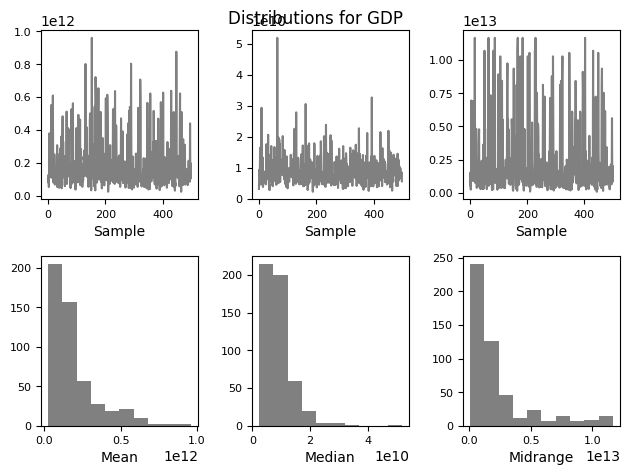

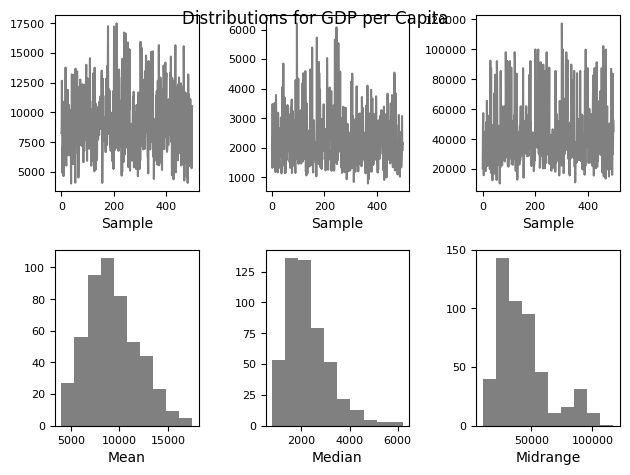

In [9]:
#TODO fix figure size and title
fs = (15,15)
f = bootstrap_plot(gdp['GDP'], size=50, samples=500, color='grey');
f.suptitle("Distributions for GDP")
f = bootstrap_plot(gdp['GDP per capita'], size=50,samples=500, color='grey');
f.suptitle("Distributions for GDP per Capita");

We have 4 numerical columns in our data (GDP, Population, GDP Per Capita, and Year) and there could potentially be interesting patterns and correlations between any set of these variables.

Below we look at all pairs of of these values on a scatter chart. There are patterns and correlations visable in every one of these graphs, but the type of relationship is not always clear and often may rely on more than the two variables shown. Since time probably plays a role in almost every relationship shown, we could try to treat time differently in our graphs such as by creating animations or using color. Hans Rosling has made some interesting animations of global scale time series in this [TED Talk by Hans Rosling](http://www.ted.com/talks/hans_rosling_shows_the_best_stats_you_ve_ever_seen?language=en) I highly recommend. His excitement level alone is inspiring.

Instead lets graph each pair of variables as axis of a scatter graph. The numbers probably won't tell you as much as the shapes in this next one.

<Figure size 640x480 with 0 Axes>

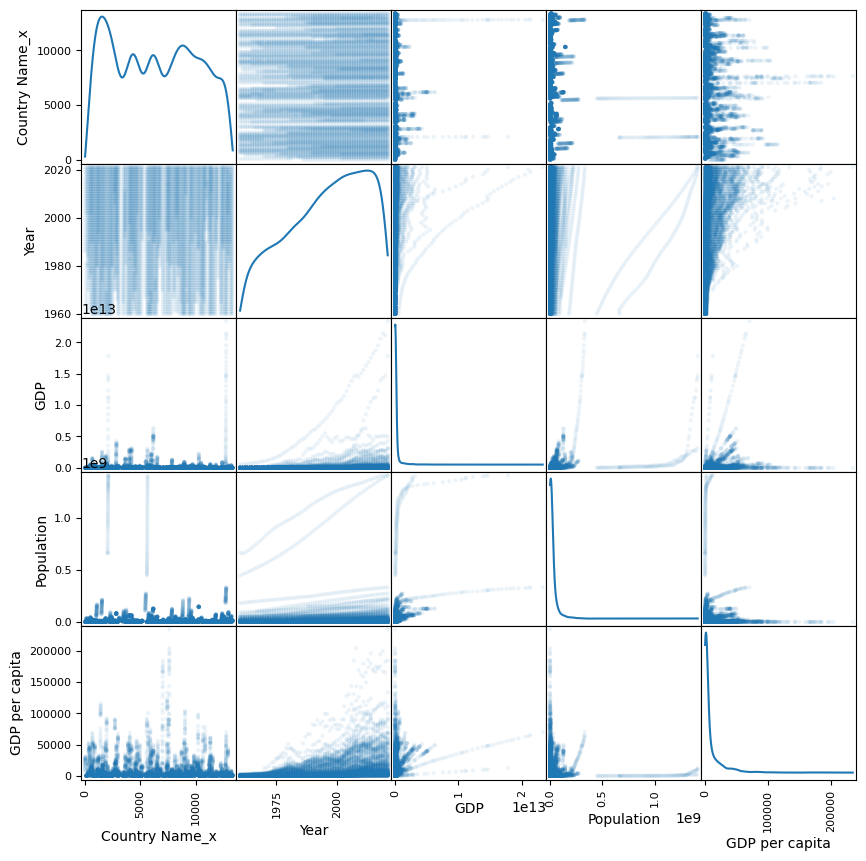

In [10]:
fig = plt.figure()
scatter_matrix(gdp, figsize=(10,10), alpha=0.078, diagonal="kde");
_ = fig;

It is the graph above showing GDP per capita versus time that has the most complex and interesting set of patterns we're going to model in the rest of this analysis. In theory, this graph contains information relating to global production per person, which is a factor of effiency, something worth optimizing.

**Philosophical Motivation:**
I do not believe wealth to be a complete measure of value in this world, 
but I do know that it a measurable one, and therefor potentially a signal that can be modelled and used to better society. Proving techniques like this should motivate investigations into how we can measure other types of value in the world so that they may be better similarly understood. In the future I believe we will measure empathy and stress like we do oil barrel prices today.

## The Whole World

In [11]:
world_gdp.head()

,WLD,Population
Year,,
1960,1.384857e+12,3031564839
1961,1.449221e+12,3072510552
1962,1.550815e+12,3126934725
1963,1.671447e+12,3193508879
1964,1.830492e+12,3260517816


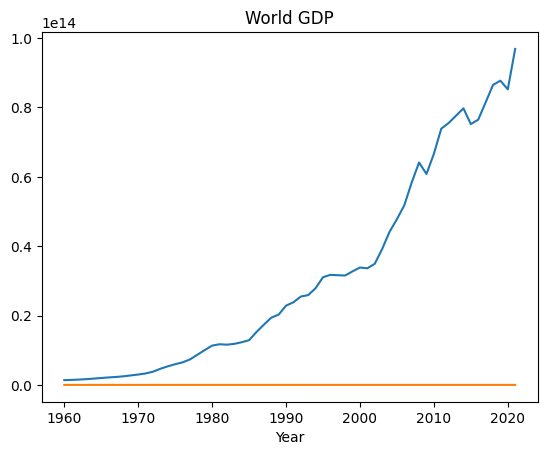

In [12]:
ax = world_gdp.plot(legend=False, title="World GDP");
#ax.patch.set_facecolor('black')

The graph below shows all the world's country's GDPs. Each series/line is a different country. While the large number of lines make it impossible to pick out individual countries (also the reason why a legend was not included), this chart lets us do a high-level view of the data and gives us a sense of the net motion of collection.

In [13]:
gdp.head()

,Country Name_x,Country Code,Year,GDP,Country Name_y,Population,GDP per capita
0,0,ABW,1986,4.055866e+08,Aruba,64553,6283.001443
1,1,ABW,1987,4.877095e+08,Aruba,64450,7567.253642
2,2,ABW,1988,5.966480e+08,Aruba,64332,9274.514156
3,3,ABW,1989,6.955307e+08,Aruba,64596,10767.396220
4,4,ABW,1990,7.648045e+08,Aruba,65712,11638.733706


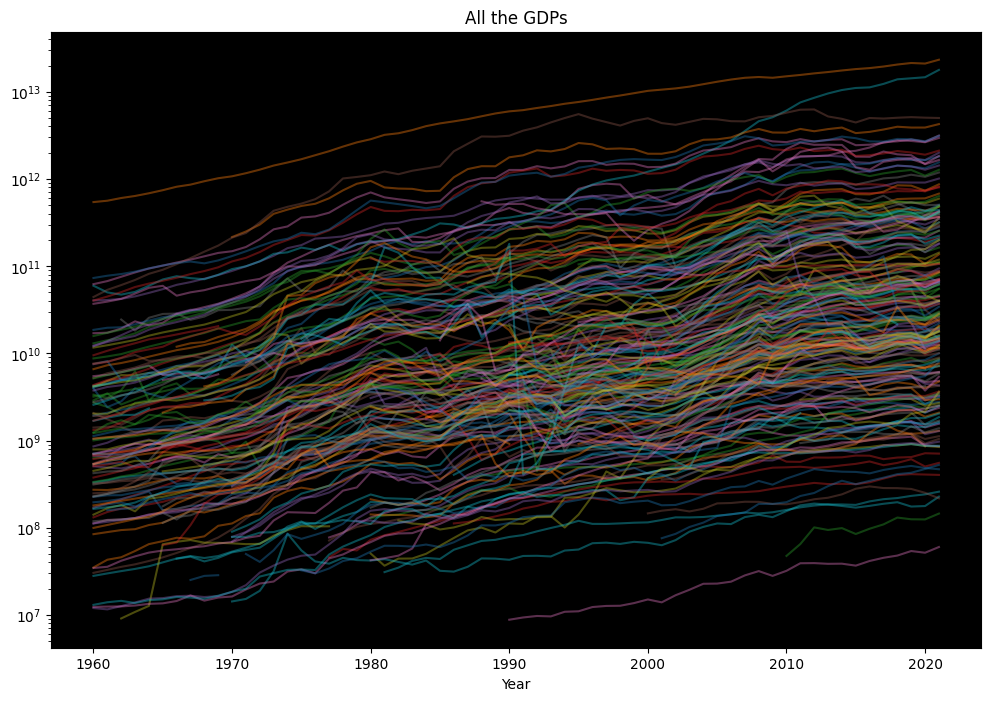

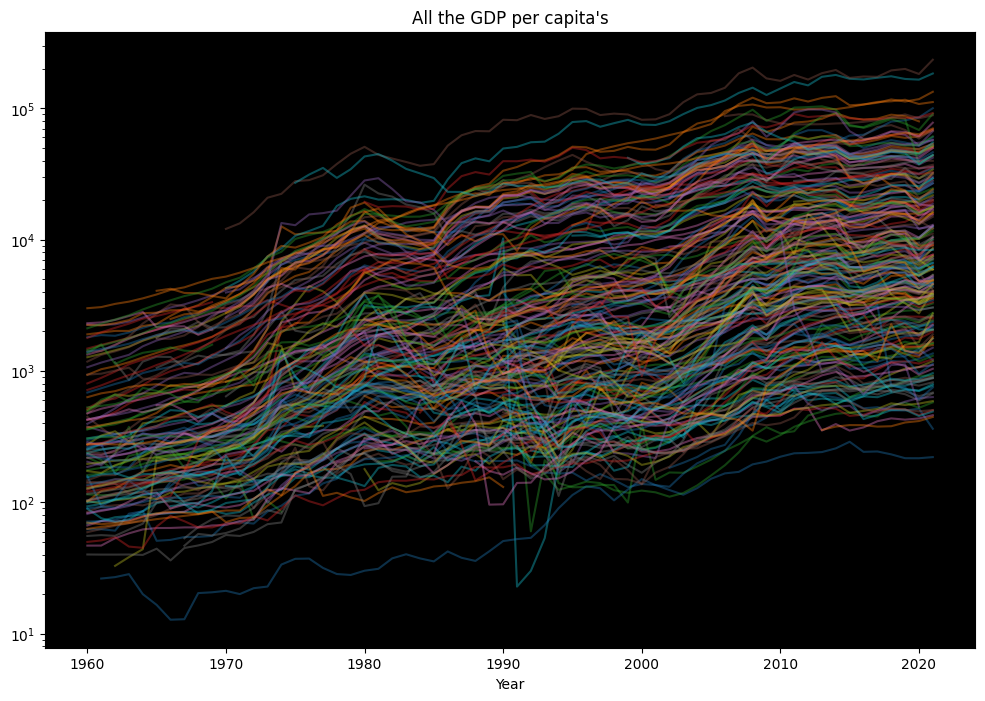

In [14]:
fs = (12,8) #figure size
#lg = False
lgy = True
gdp_by_country = gdp.pivot(index="Year", columns="Country Name_y", values = "GDP")
ax = gdp_by_country.plot(logy=lgy, legend=False, figsize=fs, alpha=.4, title='All the GDPs')
ax = invert_colors(ax, grid=False)
gdp_pc_by_country = gdp.pivot(index="Year", columns="Country Name_y", values = "GDP per capita")
ax = gdp_pc_by_country.plot(logy=lgy, legend=False, figsize=fs, alpha=.4, title="All the GDP per capita's")
ax = invert_colors(ax, grid=False)

Note the data look linear on a logarithmic scale. Using a logarithmic scale causes the size of motion in a signal to be proportional to its size.
Let us dive deeper...

The wide range of values for GDP per capita in the graph above make it hard to tell what group motion looks like. Let us shift and scale each country's data to be between 0 and 1. If we see simultaneous changes across groups of countries, we should suspect some relationship exists to link these countries. If we can isolate those relationships, we may be able to make some meaningful predictions based upon them.

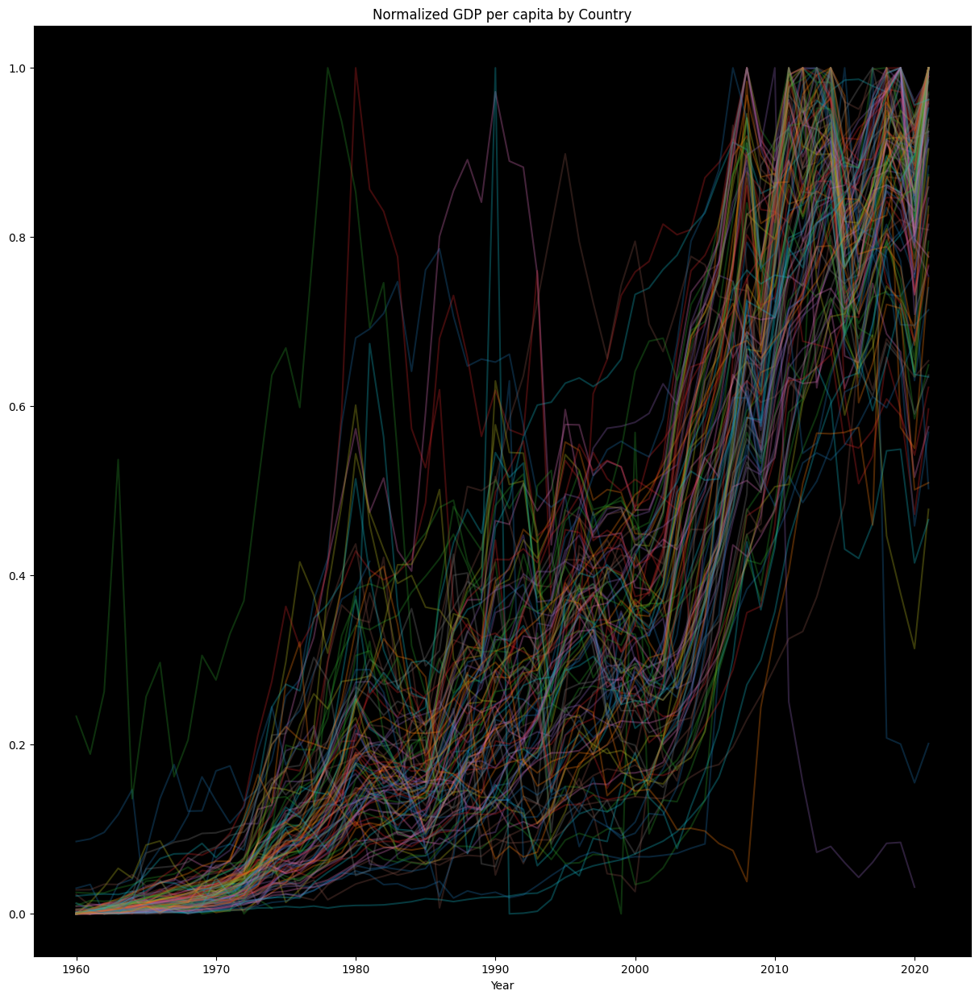

In [15]:
fs = (15,15) #figure size
counter = 0
leg = False #legend
lgy = True
al = .3 #alpha
gdp_by_country_norm = gdp_by_country.apply(calc_norm)
gdp_pc_by_country_norm = gdp_pc_by_country.apply(calc_norm)
#ax = gdp_by_country_norm.plot(legend=leg, logy=lgy, style=st, figsize=fs, alpha=al, title="Normalized GDP by Country")
ax = invert_colors(ax, grid=False)
ax = gdp_pc_by_country_norm.plot(
    legend=leg,
    #logy=lgy,
    figsize=fs, alpha=al, title="Normalized GDP per capita by Country");
ax = invert_colors(ax, grid=False)
counter+=1

The brighter region containing most of the countries indicates this data contains a signal comprised of individual countries and more importantly relationships and interactions between countries.

## Rate of Change

In this section we will look at how GDP values grow and contract over time. Countries sharing growth patterns may be experiencing similar conditions and forces impacting their change in output. The range of these forces can be extremely varied (just speculating: known abundence of natural resources, trade relations, etc.). First we look at the change in gdp from year to year. Then let us look at some graphs of the same data.

In [16]:
diff_gdp = gdp_by_country.apply(lambda x: x.diff()/x, axis=0)
diff_gdp_pc = gdp_by_country.apply(lambda x: x.diff()/x, axis=0)
diff_gdp_pc.dropna()
#diff_gdp.plot(kind="kde")
diff_gdp_pc.tail()

Country Name_y,Afghanistan,Albania,Algeria,American Samoa,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Aruba,...,Uruguay,Uzbekistan,Vanuatu,"Venezuela, RB",Vietnam,Virgin Islands (U.S.),West Bank and Gaza,"Yemen, Rep.",Zambia,Zimbabwe
Year,,,,,,,,,,,,,,,,,,,,,
2017,0.046400,0.088982,0.059159,-0.096405,0.034515,0.277389,0.021370,0.133767,0.085129,0.035050,...,0.115762,-0.387507,0.112688,NaN,0.086218,-0.001054,0.044804,-0.166737,0.189969,-0.168542
2018,-0.025924,0.140976,0.027522,0.042254,0.067815,0.113380,0.085255,-0.226380,0.074690,0.056166,...,0.003022,-0.174223,0.037907,NaN,0.092719,0.032636,0.009130,-0.242342,0.016643,0.485161
2019,0.025689,0.015933,-0.018343,0.012365,-0.020053,-0.122406,0.042159,-0.172115,0.085272,0.035222,...,-0.050839,0.122976,0.023266,NaN,0.072552,0.047365,0.050013,NaN,-0.128829,-0.564479
2020,0.061506,-0.015768,-0.178509,0.096369,-0.091369,-0.379523,-0.182904,-0.161369,-0.077331,-0.301051,...,-0.156180,-0.000976,-0.029805,NaN,0.035343,0.020695,-0.103131,NaN,-0.287015,-0.014995
2021,-0.381284,0.154364,0.108450,-0.009873,0.130564,0.235122,0.092386,0.208705,0.087993,0.165060,...,0.126121,0.134710,0.064031,NaN,0.053318,NaN,0.142321,NaN,0.182277,0.241848


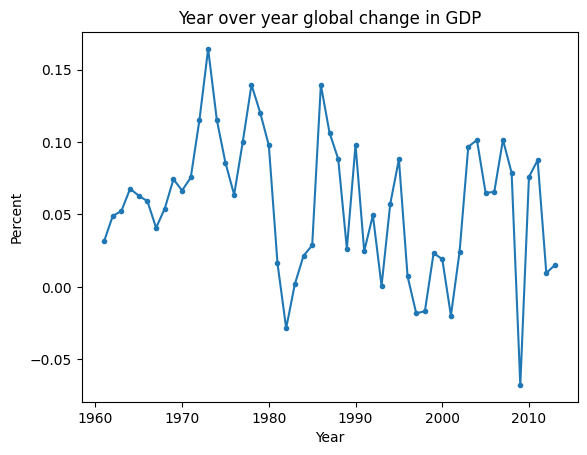

In [17]:
wld_gdp_pc = world_gdp.WLD/world_gdp.Population
diff_wrd_gdp = wld_gdp_pc.diff()/wld_gdp_pc
ax = diff_wrd_gdp.loc[range(1960,2014)].plot(legend=False, style='.-', title="Year over year global change in GDP")
#ax = diff_gdp_pc.ix[range(1960,2014)].sum(axis=1).plot(legend=False, style='.', title="Year over year global change in GDP")
ax.set_ylabel('Percent');
#ax = invert_colors(ax)

In [18]:
diff_gdp_perc_of_wld = gdp_pc_by_country.fillna(method='backfill').apply(
    (lambda x: x.diff()), axis=0
)
diff_gdp_perc_of_wld['WLD'] = wld_gdp_pc
diff_gdp_perc_of_wld.apply(lambda x: x/diff_gdp_perc_of_wld['WLD'])

#.join(wld_gdp_pc, on="Year")
        #/wld_gdp_pc#.diff()
diff_gdp_perc_of_wld['WLD'].head(100);

/tmp/ipykernel_46275/3481514456.py:1: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  diff_gdp_perc_of_wld = gdp_pc_by_country.fillna(method='backfill').apply(


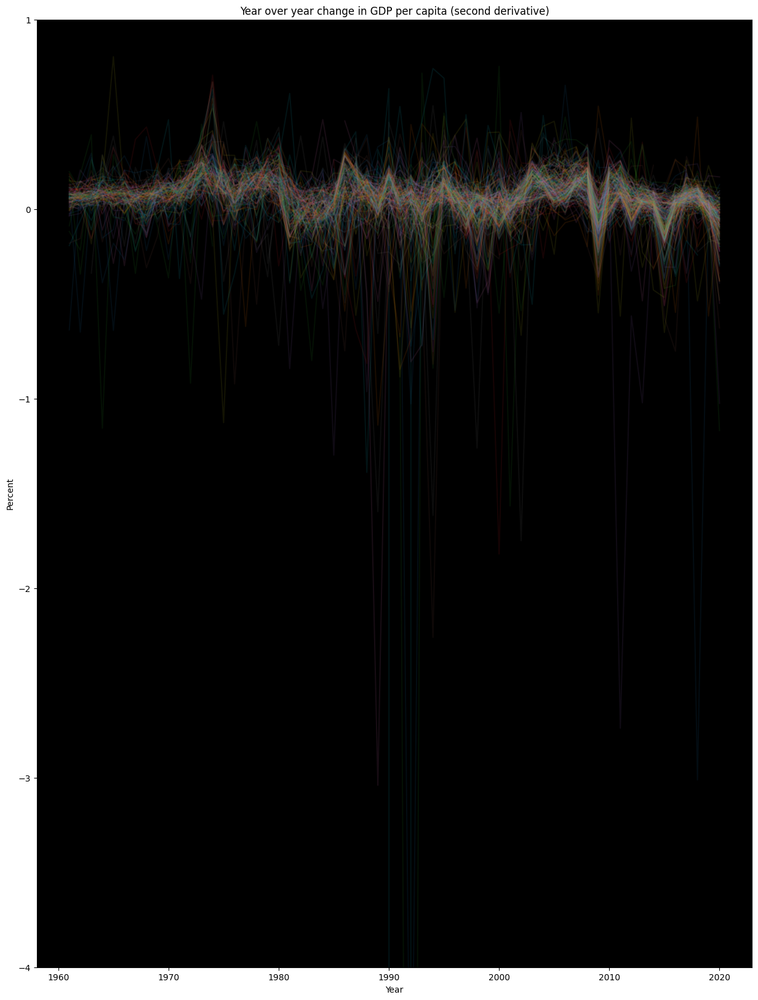

In [19]:
ax = diff_gdp_pc.loc[range(startYear,endYear)].plot(kind='line', style='-', alpha=0.1, figsize=(15,20), ylim=(-4, 1), legend=False, title="Year over year change in GDP per capita (second derivative)")
ax = invert_colors(ax, grid=False)
ax.set_ylabel("Percent");
#savefig('test.png', bbox_inches='tight')

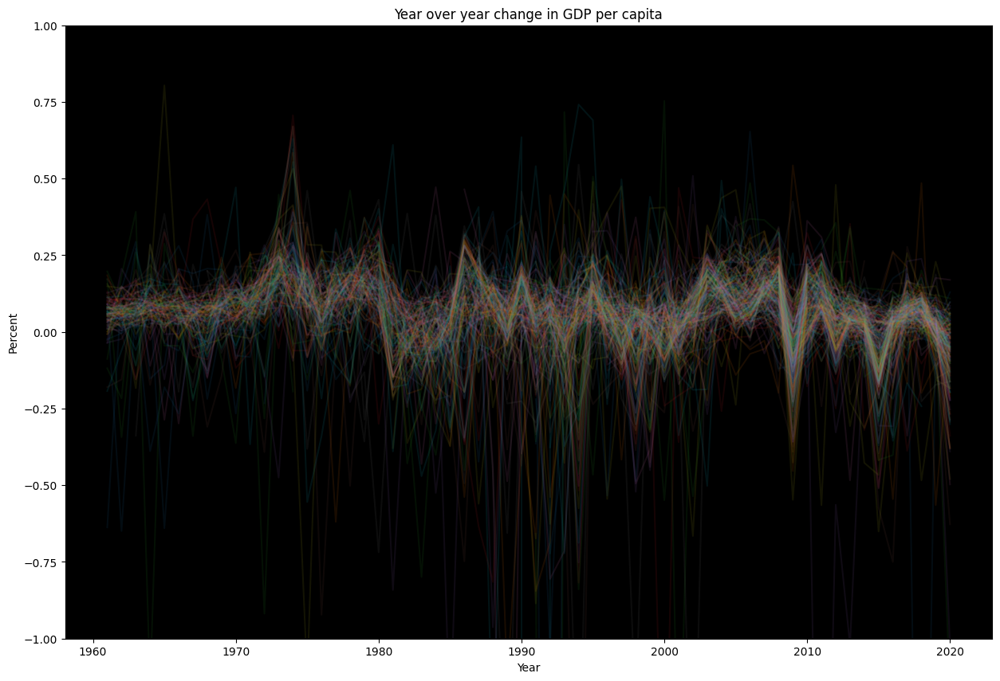

In [20]:
#same graph as last cell but different ylims
ax = diff_gdp_pc.loc[range(startYear,endYear)].plot(kind='line', style='-', alpha=0.1, figsize=(15,10), ylim=(-1, 1), legend=False, title="Year over year change in GDP per capita")
ax = invert_colors(ax, grid=False)
ax.set_ylabel("Percent");
#savefig('test.png', bbox_inches='tight')

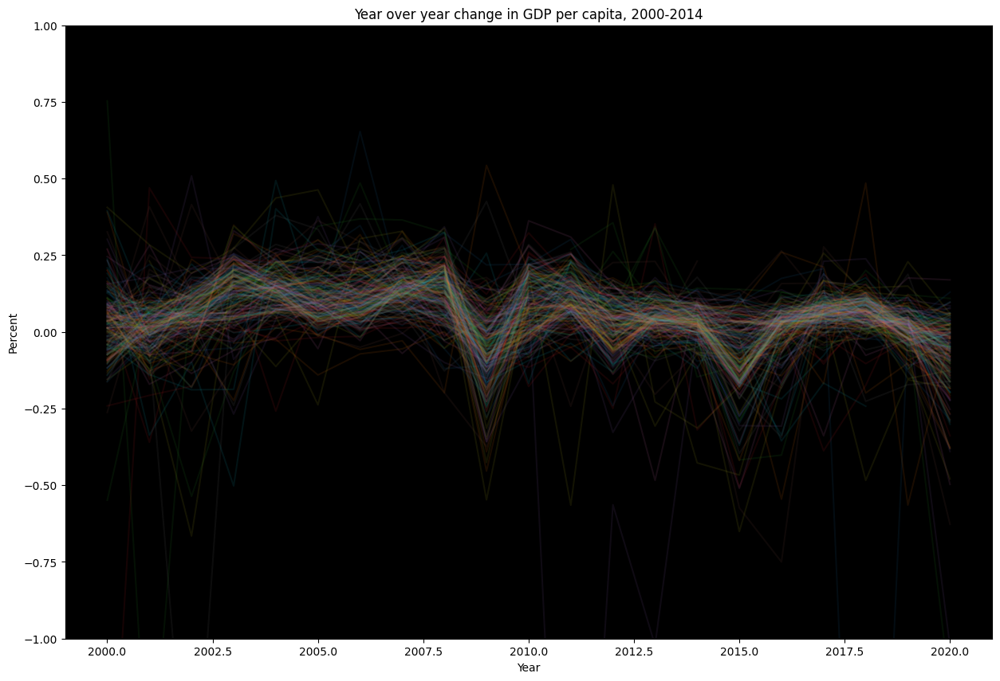

In [21]:
#same graph as last cell but different xlims
ax = diff_gdp_pc.loc[range(2000,endYear)].plot(kind='line', style='-', alpha=0.1, figsize=(15,10), ylim=(-1, 1), legend=False, title="Year over year change in GDP per capita, 2000-2014")
ax = invert_colors(ax, grid=False)
ax.set_ylabel("Percent");
#savefig('test.png', bbox_inches='tight')

I love seeing the whole world moving together like that. Let's talk a little about how this view of the data could be interpreted. A year over year change is  GDP per Capita

So obviously there is some group motion here, but we want to isolate the relationships between countries, so global gdp motion needs to be normalized out, like so:

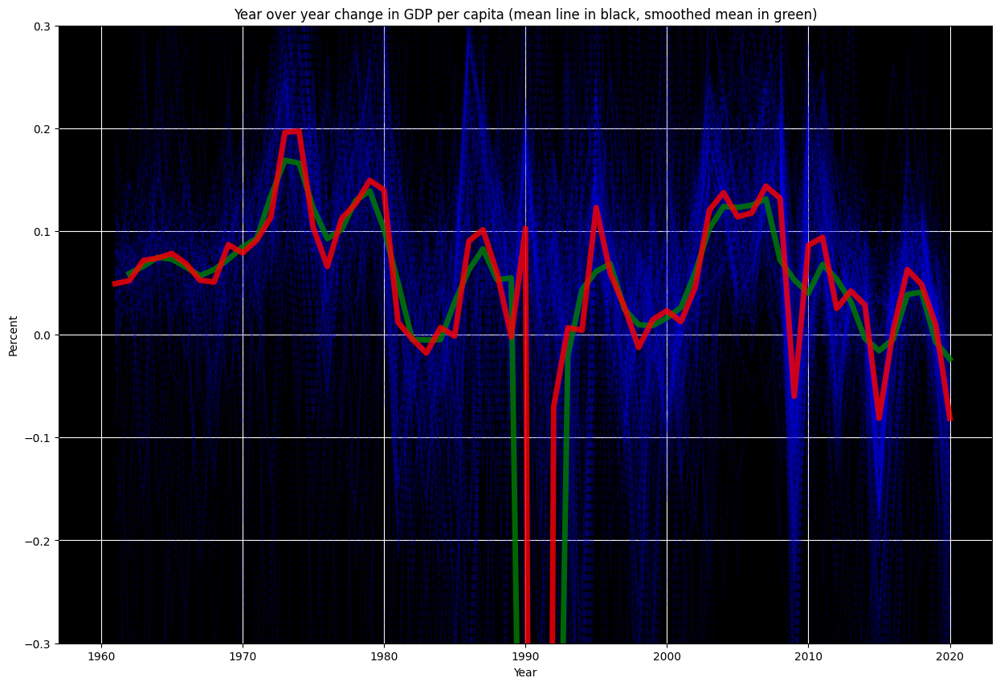

In [22]:
#should we normalize based upon a population weighted mean? probably worth checking out
#same graph as last cell but with mean line drawn
ax = diff_gdp_pc.loc[range(startYear,endYear)].plot(kind='line', style='--b', alpha=0.1, figsize=(15,10), ylim=(-.3,.3), legend=False, title="Year over year change in GDP per capita")
ax = world_gdp.loc[range(startYear,endYear)]['WLD'].plot(kind='line', ax = ax, style='-', linewidth=5, alpha=1, legend=False, title="Year over year change in GDP per capita (mean line in BOLD)")
#ax = diff_gdp_pc.loc[range(startYear,endYear)].apply(lambda x: smooth(x, box_pts=3), axis=0).mean(weights=pops_weights, axis=1).plot(kind='line', ax = ax, style='-g', alpha=.8, linewidth=5, ylim=(-.3,.3), legend=False, title="Year over year change in GDP per capita (mean line in BOLD)")
ax = diff_gdp_pc.loc[range(startYear,endYear)].apply(lambda x: smooth(x, box_pts=3), axis=0).mean(axis=1).plot(kind='line', ax = ax, style='-g', alpha=.8, linewidth=5, ylim=(-.3,.3), legend=False, title="Year over year change in GDP per capita (mean line in BOLD)")
# ax = diff_gdp_pc.loc[range(startYear,endYear)].mean(weights=pops_weights, axis=1).plot(kind='line', ax = ax, style='-r', alpha =.8, linewidth=5, ylim=(-.3,.3), legend=False, title="Year over year change in GDP per capita (mean line in black, smoothed mean in green)")
ax = diff_gdp_pc.loc[range(startYear,endYear)].mean(axis=1).plot(kind='line', ax = ax, style='-r', alpha =.8, linewidth=5, ylim=(-.3,.3), legend=False, title="Year over year change in GDP per capita (mean line in black, smoothed mean in green)")
ax = invert_colors(ax, grid=True)
ax.set_ylabel("Percent");
#savefig('test.png', bbox_inches='tight')

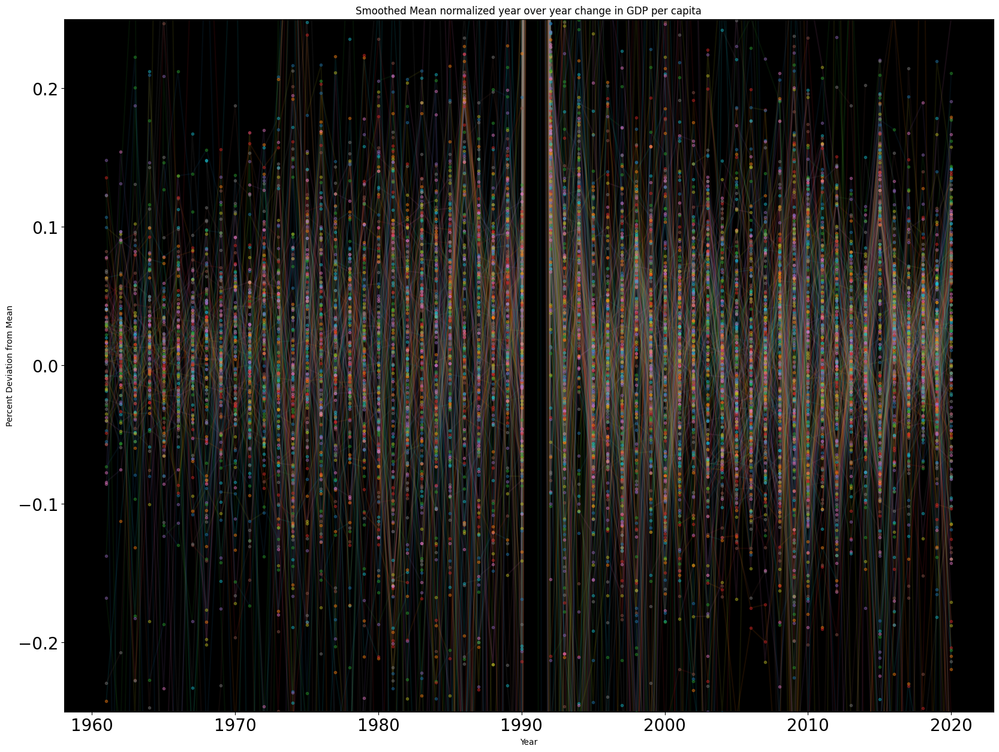

In [23]:
#Remove trend line
#TODO: calc mean based on a windowed outlier reduction
timeRange = range(startYear,endYear)
# means = diff_gdp_pc.copy().mean(weights=pops_weights, axis=1)
means = diff_gdp_pc.copy().mean(axis=1)
stripped_diff_gdp = diff_gdp_pc.loc[timeRange].copy().apply(lambda x: x - means)

ax = stripped_diff_gdp.loc[range(startYear,endYear)].plot(kind='line', style='-', alpha=0.1, figsize=(20,15), ylim=(-.25,.25), legend=False, title="Mean normalized year over year change in GDP per capita")
stripped_diff_gdp.loc[range(startYear,endYear)].plot(kind='line', style='.', alpha=.4, figsize=(20,15), fontsize=20, ylim=(-.25,.25), legend=False, title="Smoothed Mean normalized year over year change in GDP per capita", ax=ax)
#ax = stripped_diff_gdp.ix[range(startYear,endYear)].mean(axis=1).plot(kind='line', ax = ax, style='-', linewidth=5, alpha=1, ylim=(-.5,.5), legend=False)
ax = invert_colors(ax, grid=False)
ax.set_ylabel("Percent Deviation from Mean");
#savefig('test.png', bbox_inches='tight')

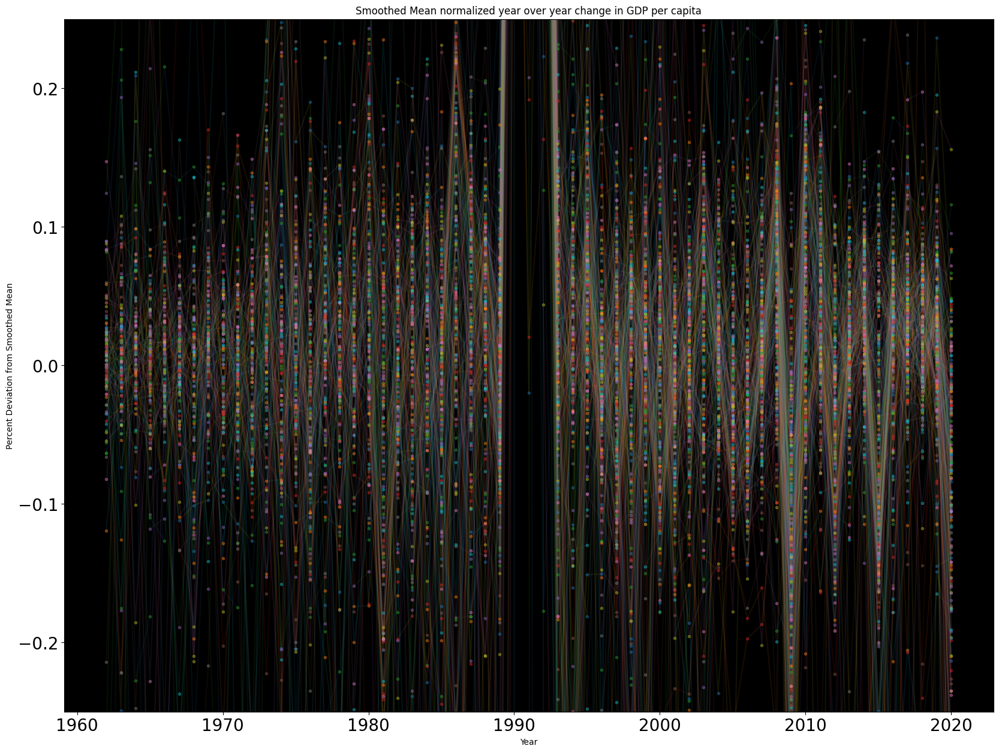

In [24]:
# smooth_means = diff_gdp_pc.apply(lambda x: smooth(x, box_pts=3), axis=0).mean(weights=pops_weights, axis=1)
smooth_means = diff_gdp_pc.apply(lambda x: smooth(x, box_pts=3), axis=0).mean(axis=1)

smooth_stripped_diff_gdp = diff_gdp_pc.loc[timeRange].copy().apply(lambda x: x - smooth_means)

ax = smooth_stripped_diff_gdp.loc[range(startYear,endYear)].plot(kind='line', style='-', alpha=0.1, figsize=(20,15), fontsize=20, ylim=(-.25,.25), legend=False, title="Smoothed Mean normalized year over year change in GDP per capita")
smooth_stripped_diff_gdp.loc[range(startYear,endYear)].plot(kind='line', style='.', alpha=.4, figsize=(20,15), fontsize=20, ylim=(-.25,.25), legend=False, title="Smoothed Mean normalized year over year change in GDP per capita", ax=ax)
#ax = smooth_stripped_diff_gdp.ix[range(startYear,endYear)].mean(axis=1).plot(kind='line', ax = ax, style='-', linewidth=5, alpha=1, ylim=(-.5,.5), legend=False)
ax = invert_colors(ax, grid=False)
ax.set_ylabel("Percent Deviation from Smoothed Mean");

#Sneak peak at relationships
Above we took the raw GDP per captia values, looked at how they are changing over time, and tried to isolate changes that were specific to subsets of the globe rather than global changes. In the process, we also isolated global changes which we will later use as another feature for model generation. We can look for correlations in the normalized signal above to determine a type of similarity between countries relative GDP per captita changes. I'm going to keep the detail of explanation light in this section, with the intent of providing a more clear explanation in the next notebook on patterns and similarity metrics.

For the moment let us look at the exponentially-weighted moving correlation of our normalized signal. This metric will look for similar changes across countries, weighting the most recent values as expontentially more signficant.

In [25]:
ecorr_stripped_diff_gdp = stripped_diff_gdp.ewm(span=10).corr()

In [26]:
countries = ['United States','South Africa','Ukraine']

In [27]:
for c in countries:
    #see who's most like a United States
    print(ecorr_stripped_diff_gdp.loc[endYear, c].dropna().sort_values(inplace=False, ascending=False).head())
    print('')

Country Name_y
United States                     1.000000
St. Vincent and the Grenadines    0.969383
Puerto Rico                       0.944064
Hong Kong SAR, China              0.931545
El Salvador                       0.929280
Name: (2021, United States), dtype: float64

Country Name_y
South Africa    1.000000
Eswatini        0.970859
Namibia         0.925197
Lesotho         0.869519
Chile           0.762598
Name: (2021, South Africa), dtype: float64

Country Name_y
Ukraine               1.000000
Russian Federation    0.794957
Moldova               0.760519
Brunei Darussalam     0.678051
Belarus               0.649224
Name: (2021, Ukraine), dtype: float64



In [28]:
ecorr_stripped_diff_gdp.loc[endYear].sum().sort_values(inplace=False, ascending=False)

Country Name_y
Morocco                      107.475762
Vanuatu                      101.144210
Belgium                       98.974780
France                        98.576653
Italy                         98.308732
                                ...    
Turks and Caicos Islands     -11.561279
Northern Mariana Islands     -12.667563
Sint Maarten (Dutch part)    -15.154429
Curacao                      -16.125398
Iraq                        -114.589713
Length: 212, dtype: float64

In [29]:
ecorr_stripped_diff_gdp.head()

Country Name_y       Afghanistan  Albania  Algeria  American Samoa  Andorra  \
Year Country Name_y                                                           
1960 Afghanistan             NaN      NaN      NaN             NaN      NaN   
     Albania                 NaN      NaN      NaN             NaN      NaN   
     Algeria                 NaN      NaN      NaN             NaN      NaN   
     American Samoa          NaN      NaN      NaN             NaN      NaN   
     Andorra                 NaN      NaN      NaN             NaN      NaN   

Country Name_y       Angola  Antigua and Barbuda  Argentina  Armenia  Aruba  \
Year Country Name_y                                                           
1960 Afghanistan        NaN                  NaN        NaN      NaN    NaN   
     Albania            NaN                  NaN        NaN      NaN    NaN   
     Algeria            NaN                  NaN        NaN      NaN    NaN   
     American Samoa     NaN                  NaN        NaN      NaN    NaN   
     Andorra            NaN                  NaN        NaN      NaN    NaN   

Country Name_y       ...  Uruguay  Uzbekistan  Vanuatu  Venezuela, RB  \
Year Country Name_y  ...                                                
1960 Afghanistan     ...      NaN         NaN      NaN            NaN   
     Albania         ...      NaN         NaN      NaN            NaN   
     Algeria         ...      NaN         NaN      NaN            NaN   
     American Samoa  ...      NaN         NaN      NaN            NaN   
     Andorra         ...      NaN         NaN      NaN            NaN   

Country Name_y       Vietnam  Virgin Islands (U.S.)  West Bank and Gaza  \
Year Country Name_y                                                       
1960 Afghanistan         NaN                    NaN                 NaN   
     Albania             NaN                    NaN                 NaN   
     Algeria             NaN                    NaN                 NaN   
     American Samoa      NaN                    NaN                 NaN   
     Andorra             NaN                    NaN                 NaN   

Country Name_y       Yemen, Rep.  Zambia  Zimbabwe  
Year Country Name_y                                 
1960 Afghanistan             NaN     NaN       NaN  
     Albania                 NaN     NaN       NaN  
     Algeria                 NaN     NaN       NaN  
     American Samoa          NaN     NaN       NaN  
     Andorra                 NaN     NaN       NaN  

[5 rows x 212 columns]

In [30]:
#prep stripped_diff_gdp
stripped_diff_gdp_T = stripped_diff_gdp.copy().T
diff_gdp_T = diff_gdp.copy().T
gdp_means = pandas.DataFrame(means, columns=["global mean (each country=1) gdp percent change"])
gdp_smoothed_means = pandas.DataFrame(smooth_means, columns=["global smoothed "])


In [31]:
gdp_pc = gdp.pivot(index="Year",columns="Country Name_y", values="GDP per capita")

In [32]:
gdp_pc.tail()

Country Name_y,Afghanistan,Albania,Algeria,American Samoa,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Aruba,...,Uruguay,Uzbekistan,Vanuatu,"Venezuela, RB",Vietnam,Virgin Islands (U.S.),West Bank and Gaza,"Yemen, Rep.",Zambia,Zimbabwe
Year,,,,,,,,,,,,,,,,,,,,,
2017,530.149863,4531.032207,4134.936099,12372.884783,40632.231554,2283.214233,16110.312400,14613.035715,4041.995072,29326.708058,...,18995.397020,1916.764625,3032.197020,NaN,2992.071746,35365.069304,3620.360487,893.716573,1495.752138,1192.107012
2018,502.057099,5287.660817,4171.795309,13195.935900,42904.828456,2487.500996,17514.355864,11795.162885,4391.923274,30918.515218,...,19026.049611,1604.258642,3076.835315,NaN,3267.225009,36653.863048,3562.330943,701.714878,1475.199836,2269.177012
2019,500.522981,5396.214227,4021.983608,13672.576657,41328.600499,2142.238757,18187.779712,9963.674231,4828.504889,31902.762582,...,18098.361549,1795.201768,3076.589886,NaN,3491.091279,38596.030712,3656.858271,NaN,1268.120941,1421.868596
2020,516.866797,5343.037704,3354.157303,15501.526337,37207.222000,1502.950754,15284.772384,8496.428157,4505.867746,24487.863569,...,15650.499427,1759.307471,2917.756849,NaN,3586.347297,39552.168595,3233.568638,NaN,956.831747,1372.696674
2021,363.674087,6377.203096,3700.311195,15743.310758,42072.341103,1903.717405,16740.348196,10636.115530,4966.513471,29342.100730,...,17923.995333,1993.424478,3044.573640,NaN,3756.489122,NaN,3678.635657,NaN,1137.344395,1773.920411


Store local 

## Store all the things
Now that we've distilled some features from our simple dataset, we can store them in MongoDB so that we can retrieve and utilize them in future notebooks.

In [34]:
# #save things to mongo
# dataframes_to_save = ['gdp_pc', 'diff_gdp_T','stripped_diff_gdp_T','diff_gdp','diff_gdp_pc','stripped_diff_gdp','smooth_stripped_diff_gdp','gdp_means']
# db = MongoClient('mongodb')
# col_base = 'gdp.analysis.exploratory.'
# for t in dataframes_to_save:
#     df = eval(t).copy()
#     df.index = stringify(df.index)
#     df.columns = stringify(df.columns)
#     d = df.to_dict()
#     col = eval('db.'+col_base+t)
#     col.drop()
#     col.insert(d)
#     #col.insert_one(d)
    
# #panels have to be saved differently
# panels_to_save = ['ecorr_stripped_diff_gdp']
# for p in panels_to_save:
#     col = eval('db.'+col_base+p)
#     col.drop()
#     panel = eval(p).copy()
#     panel.items = stringify(panel.items)
#     panel.major_axis = stringify(panel.major_axis)
#     panel.minor_axis = stringify(panel.minor_axis)
#     for i in panel.items:
#         col.insert({'item':i, 'data': panel[str(i)].to_dict()})